In [ ]:
google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!chmod 755 -R /content/drive/MyDrive/virtual_env/bin

In [ ]:
#!source /content/drive/MyDrive/virtual_env/bin/activate; pip install scanpy

In [ ]:
import sys
# add the path of the virtual environmentsite-packages to colab system path
sys.path.append("/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages")

In [ ]:
from adjustText import adjust_text
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import os
import seaborn as sns
import sys
from glob import iglob

In [ ]:
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')


scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.25.2 scipy==1.11.4 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.1 igraph==0.10.8 pynndescent==0.5.11


In [ ]:
# the directory with the `.h5` file
# use gene symbols for the variable names (variables-axis index)
output_dir="/content/drive/MyDrive/LeoDai/Private_Data/Preprocessing/chimp"
output_fig_dir="/content/drive/MyDrive/LeoDai/Private_Data/Preprocessing/chimp/Figs"
input_dir="/content/drive/MyDrive/LeoDai/Private_Data/chimp"
gene_screenfile="/content/drive/MyDrive/LeoDai/Private_Data/Preprocessing/chimp/Chimp_chrXYMT_gene.txt"
outfile="/content/drive/MyDrive/LeoDai/Private_Data/Preprocessing/chimp/chimp_all_norm_pca.h5ad"
sc.settings.figdir = output_dir

In [ ]:
adatalist = []

In [ ]:
dirlist = os.listdir(input_dir)
rm_genelist = pd.read_csv(gene_screenfile,index_col=False,sep="\t",header=0)
rm_genelist.head()

In [ ]:
#results_file=os.path.join(output_dir,outfile)
for smp_name in dirlist:
    print(smp_name)
    adata = sc.read_10x_h5(os.path.join(input_dir,smp_name,"filtered_feature_bc_matrix.h5"))

    #print((np.unique(adata.var_names)).shape)
    # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`
    adata.var_names_make_unique()

    adata.obs_names = [f"{smp_name}_{adata.obs_names[i]}" for i in range(adata.n_obs)]
    sc.external.pp.scrublet(adata)
    #fig = sc.external.pl.scrublet_score_distribution(adata,return_fig=True)
    #fig.savefig(os.path.join(output_dir,smp_name + "_scrublet_dist.png"))
    #adata = adata[adata.obs.doublet_score < 0.2,:]
    adata.obs["sample"]=smp_name
    adatalist.append(adata)
    #print(adata)
    del adata

print(len(adatalist))


In [ ]:
chimp_doublet_score_cutoffs = {'NW_TX0017-12':0.21,'NW_TX0020-6':0.17,'NW_TX0017-13':0.06,'NW_TX0020-10':0.15,'NW_TX0020-13':0.21,'NW_TX0020-7':0.16,'NW_TX0025-11':0.17,'NW_TX0025-10':0.18,'NW_TX0025-12':0.17,'NW_TX0027-6':0.18}

In [ ]:
#add category for sample number
adata=ad.concat(adatalist,merge="same")
print(adata)
del adatalist

AnnData object with n_obs × n_vars = 99618 × 21879
    obs: 'doublet_score', 'predicted_doublet', 'sample'
    var: 'gene_ids', 'feature_types', 'genome'


In [ ]:
adata.write_h5ad(os.path.join(output_dir,"chimp_all_raw.h5ad"),compression='gzip')

In [ ]:
adata = sc.read_h5ad(os.path.join(output_dir,"chimp_all_raw.h5ad"))
print(adata)

AnnData object with n_obs × n_vars = 99618 × 21879
    obs: 'doublet_score', 'predicted_doublet', 'sample'
    var: 'gene_ids', 'feature_types', 'genome'


In [ ]:
#from collections import ChainMap
#remove doublet based on cutoffs
for key,val in chimp_doublet_score_cutoffs.items() :
    #idx = adata.obs_names.str.startswith(key)
    idx = [False if (adata.obs_names[i].startswith(key)) & (adata.obs.doublet_score[i] > val) else True for i in range(adata.n_obs)]
    print(idx[0])
    adata = adata[idx,:]
    print(adata)
#adata.obs_names[:2]

In [ ]:
#from scipy.sparse import csr_matrix
#adata.X = csr_matrix(adata.X)
adata.write_h5ad(os.path.join(output_dir,"chimp_all_raw_filt_doublet.h5ad"),compression='gzip')

View of AnnData object with n_obs × n_vars = 92435 × 21879
    obs: 'doublet_score', 'predicted_doublet', 'sample'
    var: 'gene_ids', 'feature_types', 'genome'


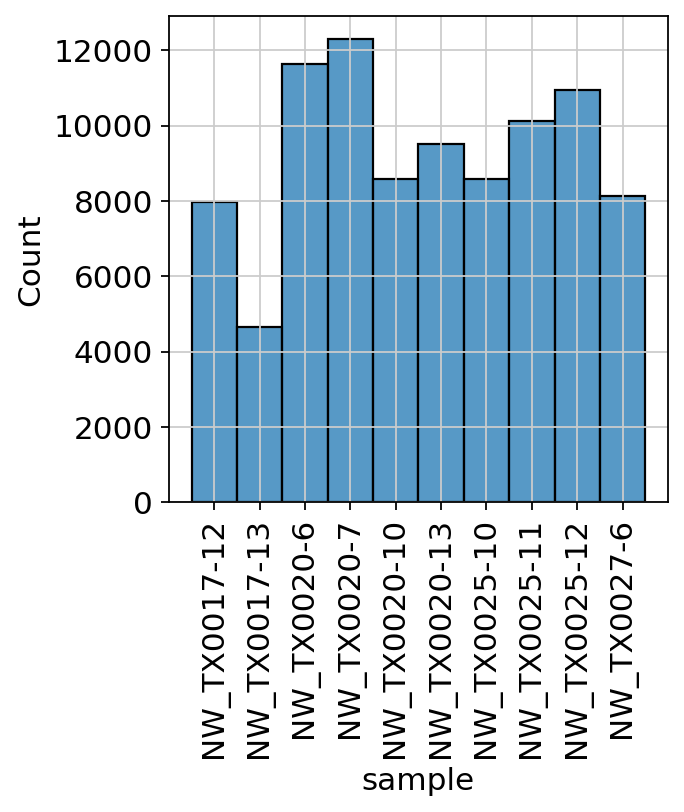

In [ ]:
print(adata)
plot = sns.histplot(adata.obs["sample"], kde=False)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.savefig(os.path.join(output_fig_dir,"sample_dist.png"),bbox_inches="tight")

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


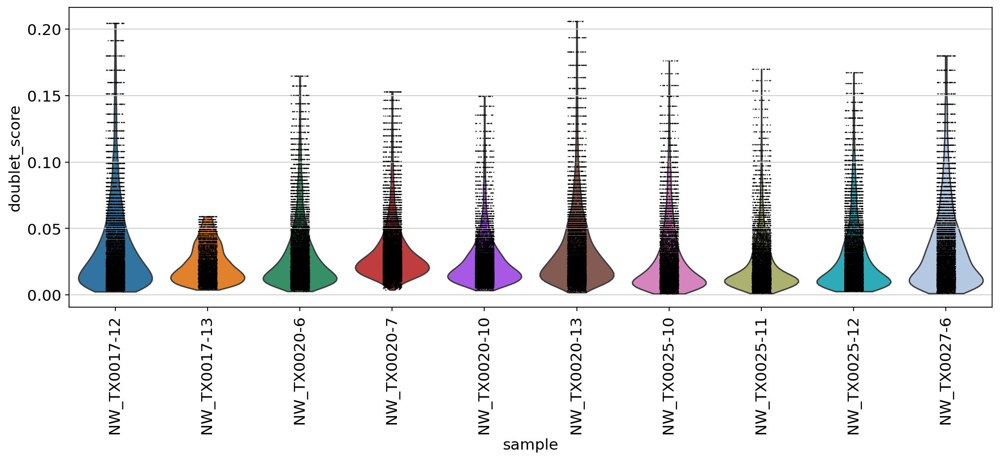

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
plot = sc.pl.violin(adata, keys="doublet_score", groupby="sample", ax=axs, show=False)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.savefig(os.path.join(output_fig_dir,"doublet_score.png"),bbox_inches="tight")

79
False    21866
True        13
Name: mt, dtype: int64
False    21800
True        79
Name: ribo, dtype: int64


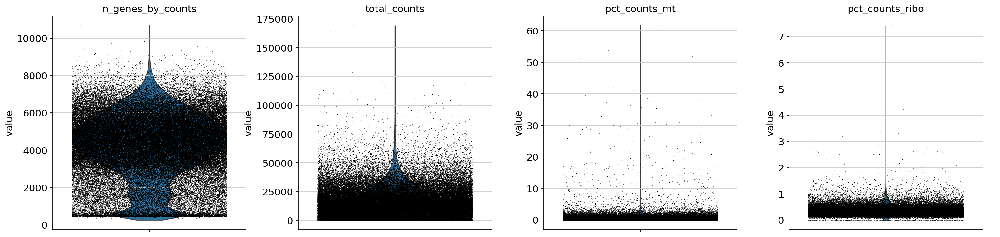

In [ ]:
# annotate the group of mitochondrial genes as 'mt'
adata.var['mt'] = adata.var_names.str.startswith('MT-')
# annotate ribosomal genes
ribo_genes = adata.var_names.str.startswith(("RPS","RPL"))
print(sum(ribo_genes))
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)
print(adata.var['mt'].value_counts())
print(adata.var['ribo'].value_counts())
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],jitter=0.4, multi_panel=True,show=False)
plt.savefig(os.path.join(output_fig_dir,"mt_ribo_qc.png"))
#plt.show()

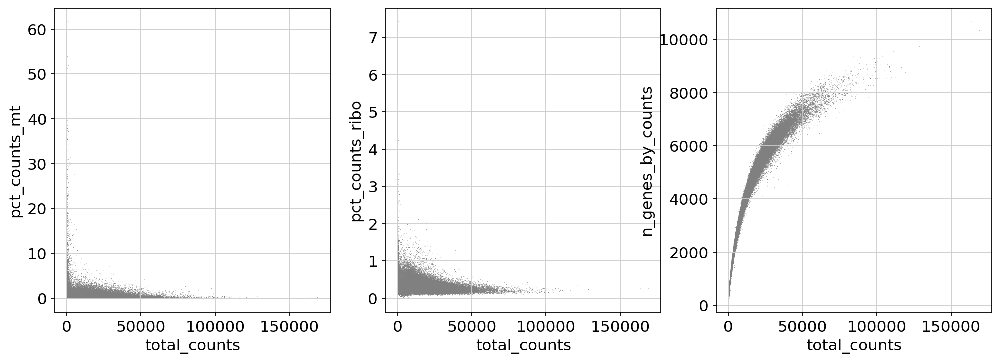

In [ ]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(15, 5))
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt',show=False,ax=ax1)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo',show=False,ax=ax2)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts',show=False, ax=ax3)
plt.savefig(os.path.join(output_dir,"mt_ribo_genes_counts.png"))


filtered out 7 genes that are detected in less than 3 cells
filtered out 16 cells that have more than 100000 counts


/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/preprocessing/_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


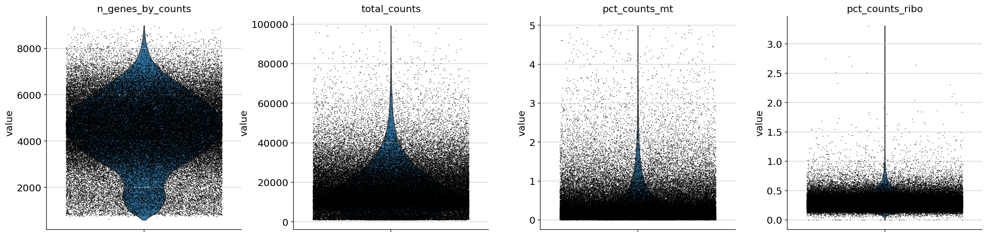

In [ ]:
#filter cells with greater or equal to 5% mt counts
#filter cells with more or equal to 2500 mt genes
#adata = adata[adata.obs.n_genes_by_counts < 8000, :]
#filter cells with less than 500 genes, less than 1000 counts
#filter genes appear in less than 3 cells
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_cells(adata, max_genes = 9000)
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata,min_counts=1000)
sc.pp.filter_cells(adata,max_counts=100000)
adata = adata[adata.obs.pct_counts_mt < 5, :]
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],jitter=0.4, multi_panel=True,show=False)
plt.savefig(os.path.join(output_dir,"after_filtering_mt_ribo_qc.png"))
#save a copy of adata after every major change

In [ ]:
#filter chrX,Y,MT genes
#filt_gene = adata.var_names[~adata.var.gene_ids.isin(rm_genelist['gene'])]
#adata = adata[:,filt_gene]
#print(adata)

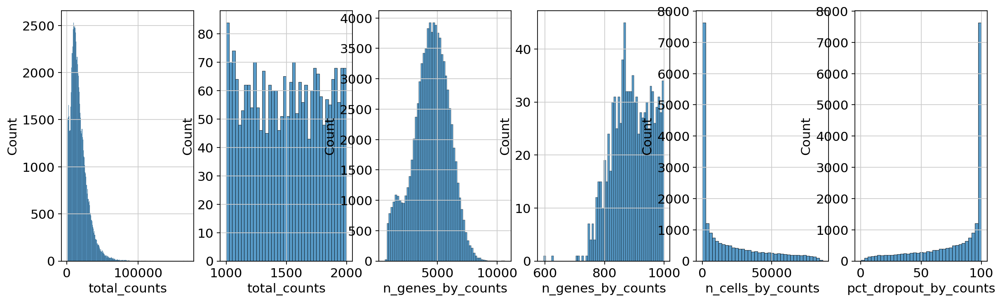

In [ ]:
fig, axs = plt.subplots(1, 6, figsize=(18, 5))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 2000], kde=False, bins=40, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 1000], kde=False, bins=60, ax=axs[3])
sns.histplot(adata.var["n_cells_by_counts"], kde=False, ax=axs[4])
sns.histplot(adata.var["pct_dropout_by_counts"], kde=False, ax=axs[5])
plt.savefig(os.path.join(output_dir,"counts_dist.png"))

normalizing counts per cell
    finished (0:00:01)


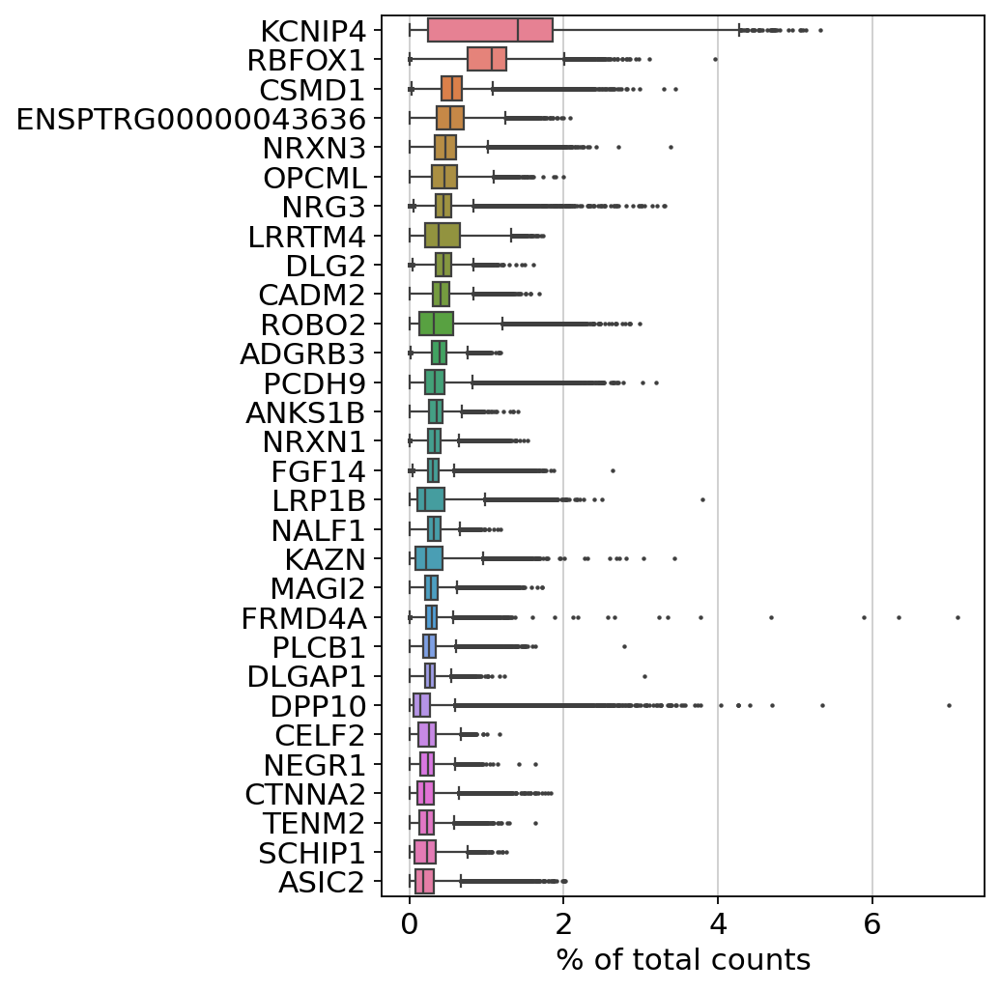

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=30)

<Axes: xlabel='total_counts', ylabel='n_genes_by_counts'>

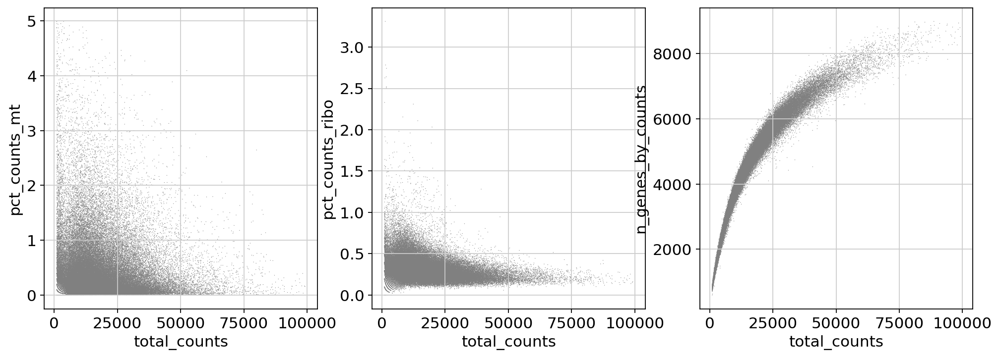

In [ ]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(15, 5))
a = sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt',show=False,ax=ax1)
a = sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo',show=False,ax=ax2)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts',show=False, ax=ax3)


In [ ]:
#rempve predicted doublet
adata = adata[adata.obs.predicted_doublet == False,:]

In [ ]:
adata.write_h5ad(os.path.join(output_dir,"chimp_all_raw_filt.h5ad"),compression='gzip')

In [ ]:
#normalization
#normalize to 10000 reads, log transformed,
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

extracting highly variable genes
    finished (0:00:23)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


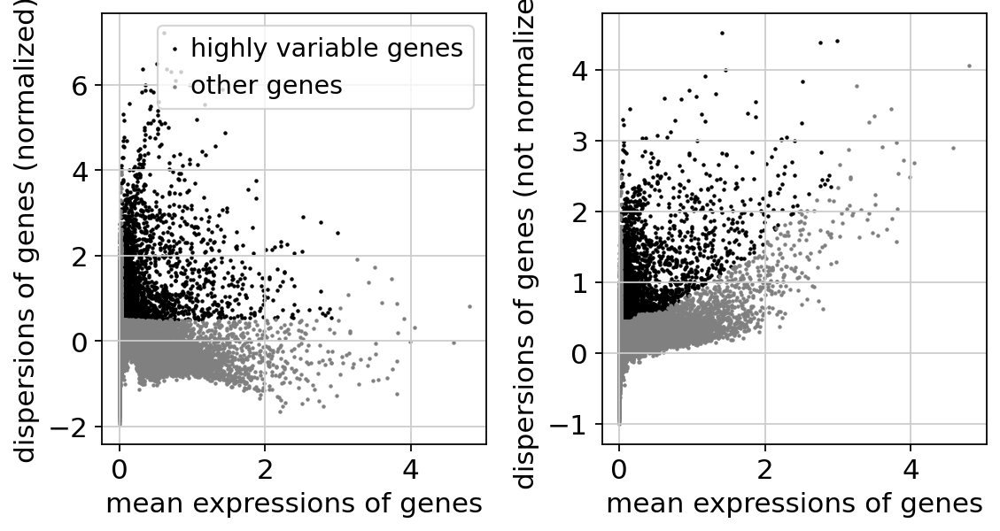

In [ ]:
#Identify highly-variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.025, max_mean=3, min_disp=0.5, flavor="seurat", batch_key='sample')
sc.pl.highly_variable_genes(adata,show=False)
plt.savefig(os.path.join(output_fig_dir,"highly_variable_genes.png"))

In [ ]:
#remove ribosomal genes from the highly variable genes selected
hvg = adata.var_names[adata.var.highly_variable]
hvg_ribo = [g for g in hvg if g.startswith('RPS') or g.startswith('RPL')]
#remove ribosomal genes from highly variable genes
adata.var['highly_variable'][adata.var_names.str.startswith('PRS')] = False
adata.var['highly_variable'][adata.var_names.str.startswith('RPL')] = False
hvg_df = pd.DataFrame()
hvg_df['gene'] = adata.var_names
hvg_df['hvg'] = adata.var.highly_variable.tolist()
hvg_df.to_csv(os.path.join(output_dir,"hvg.txt"),index=False,sep="\t")

In [ ]:
adata.raw = adata
#The result of the previous highly-variable-genes detection is stored as an annotation in .var.highly_variable and auto-detected by PCA and hence, sc.pp.neighbors and subsequent manifold/graph tools. In that case, the step actually do the filtering below is unnecessary, too.

#Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt','pct_counts_ribo'])
#Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(adata, max_value=10)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:10)


2024-03-11 05:59:33,597 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2024-03-11 06:00:02,443 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-03-11 06:00:02,896 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2024-03-11 06:00:49,483 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2024-03-11 06:01:37,774 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2024-03-11 06:02:25,097 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2024-03-11 06:02:59,581 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2024-03-11 06:03:16,465 - harmonypy - INFO - Converged after 5 iterations
INFO:harmonypy:Converged after 5 iterations


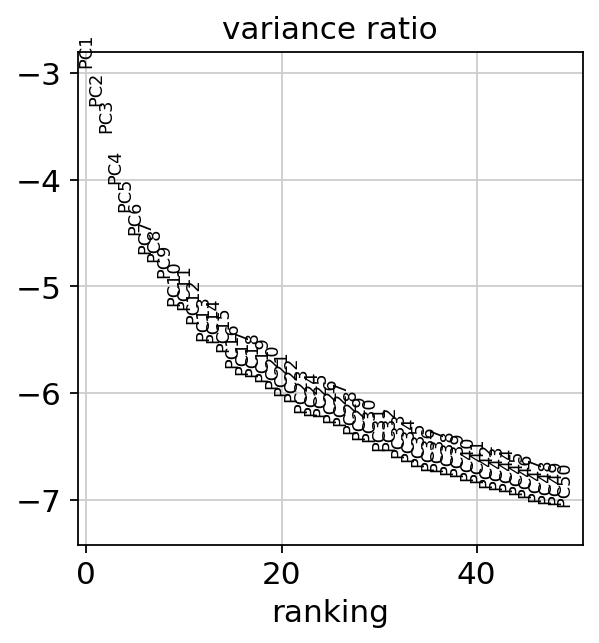

In [ ]:
#Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

sc.tl.pca(adata, svd_solver='arpack')

sc.pl.pca_variance_ratio(adata, log=True,show=False,n_pcs=50)
plt.savefig(os.path.join(output_fig_dir,"pca_var_ratio.png"))
#batch correction using Harmony
sc.external.pp.harmony_integrate(adata, 'sample')
#replcae PCA by the batch corrected data
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']

In [ ]:
#create the neighborhood graph and calculate the connectivities
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)
sc.tl.umap(adata)

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


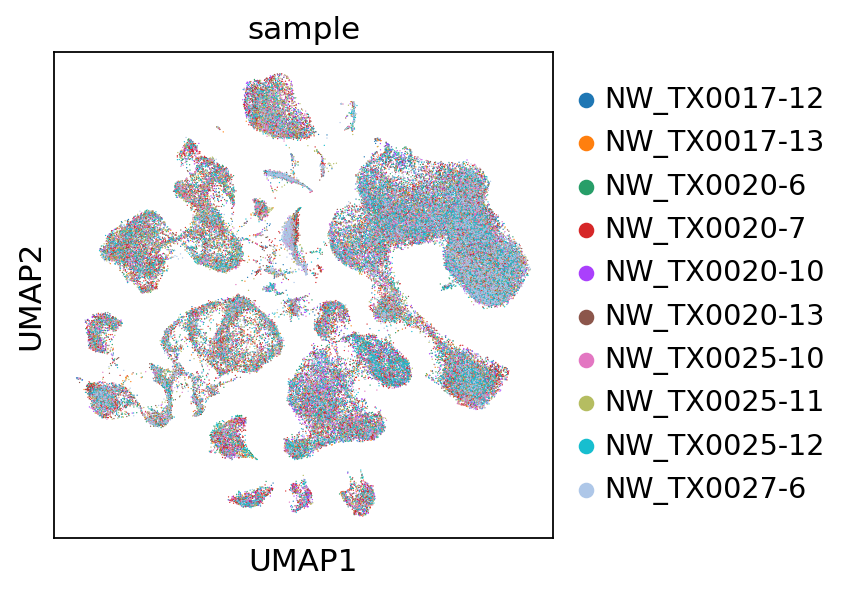

In [ ]:
sc.pl.umap(adata, color=['sample'], cmap="tab20",show=False)
plt.savefig(os.path.join(output_fig_dir,"umap_before_paga_leiden.png"))

In [ ]:
sc.tl.leiden(adata, resolution=1)

running Leiden clustering
    finished: found 39 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:08)


running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:06)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:55)


/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


[<Axes: title={'center': 'sample'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'leiden'}, xlabel='UMAP1', ylabel='UMAP2'>]

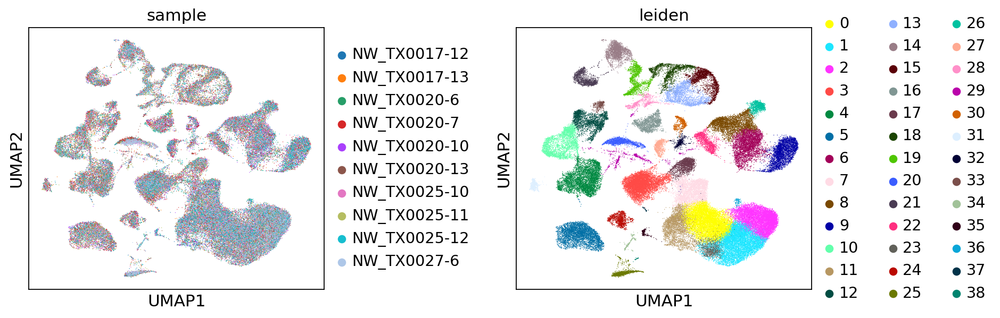

In [ ]:
#embedding the graph in two UMAP dimensions
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False,show =False,use_raw=True)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata,init_pos='paga')
sc.pl.umap(adata, color=["sample","leiden"], cmap="tab20",show=False,wspace=0.5)
#plt.savefig(os.path.join(output_fig_dir,"umap_paga_leiden.png"))

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'doublet_score',groupby="leiden", show=False,ax=axs)

plt.savefig(os.path.join(output_fig_dir,"violin_doublet_score_plot.png"))
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'pct_counts_mt',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_pct_counts_mt_plot.png"))
fig,axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'pct_counts_ribo',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_pct_counts_ribo_plot.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


<Axes: xlabel='leiden', ylabel='n_genes_by_counts'>

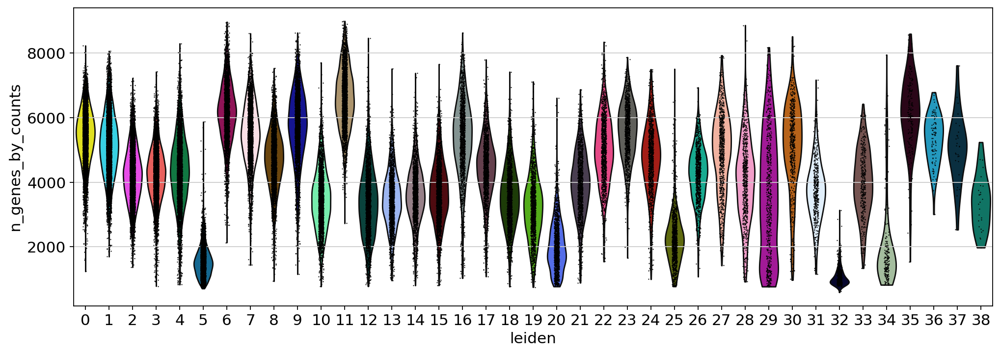

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'n_genes_by_counts',groupby="leiden", show=False,ax=axs)

In [ ]:
#cluster 34-38 have high doublet score, and also high number of genes detected. They are possible doublet, therefore removed from the downstream analysis
adata = adata[adata.obs.leiden != "34",:]
adata = adata[adata.obs.leiden != "35",:]
adata = adata[adata.obs.leiden != "36",:]
adata = adata[adata.obs.leiden != "37",:]
adata = adata[adata.obs.leiden != "38",:]
print(adata)

In [ ]:
#re do the clustering with filtered data
sc.tl.leiden(adata, resolution=1)
# embedding the graph in two UMAP dimensions
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False,show =False,use_raw=True)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata,init_pos='paga')
sc.pl.umap(adata, color=["sample","leiden"], cmap="tab20",show=False,wspace=0.5)

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


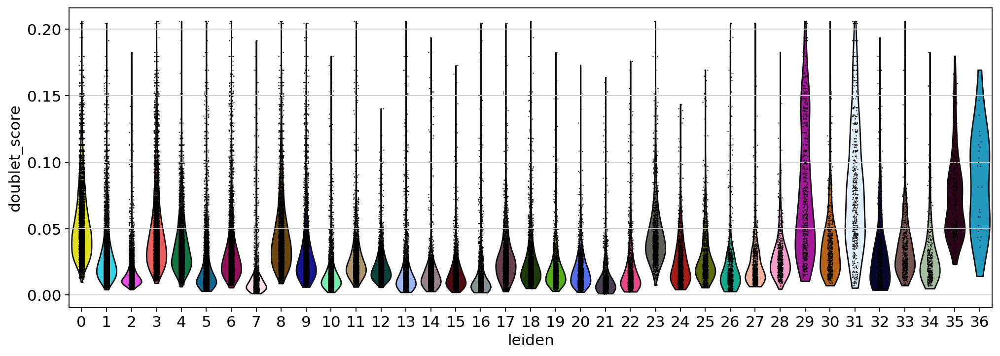

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'doublet_score',groupby="leiden", show=False,ax=axs)

plt.savefig(os.path.join(output_fig_dir,"violin_doublet_score_plot_v2.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


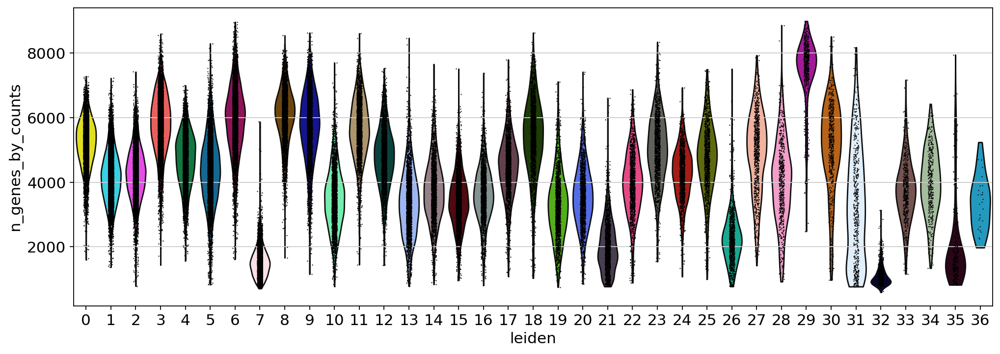

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'n_genes_by_counts',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_n_genes_by_counts_plot_v2.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


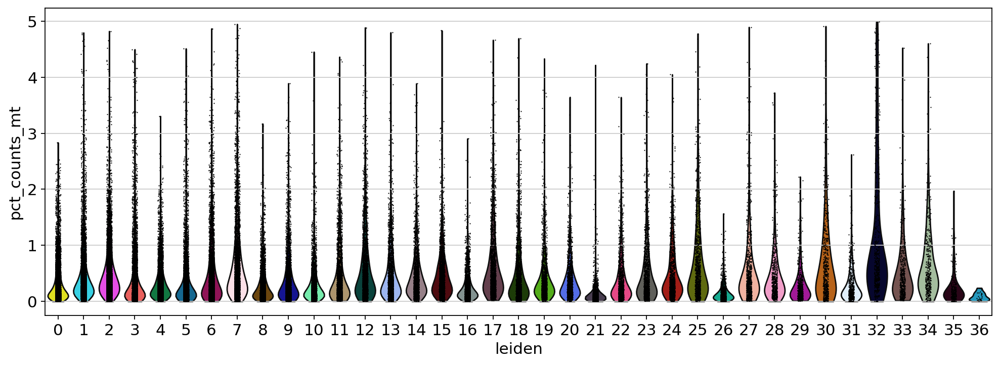

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'pct_counts_mt',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_pct_counts_mt_plot_v2.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


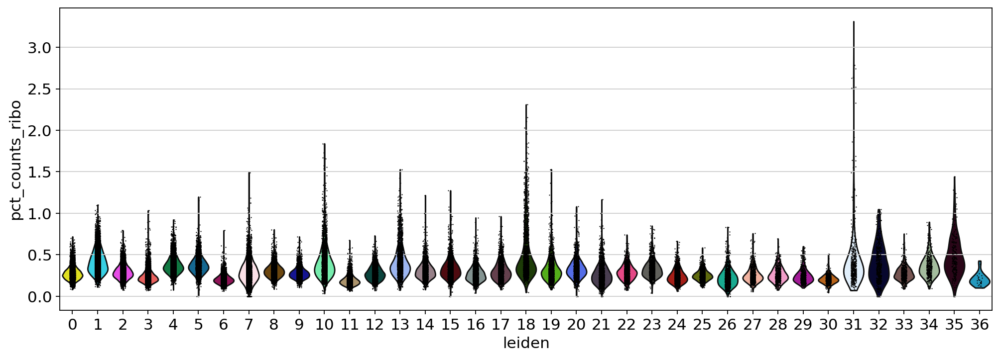

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'pct_counts_ribo',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_pct_counts_ribo_plot_v2.png"))

In [ ]:
#remove cluster 35 and 36 due to high doublet score
adata = adata[adata.obs.leiden != "35",:]
adata = adata[adata.obs.leiden != "36",:]
print(adata)

In [ ]:
#re do the clustering with filtered data
sc.tl.leiden(adata, resolution=1)

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


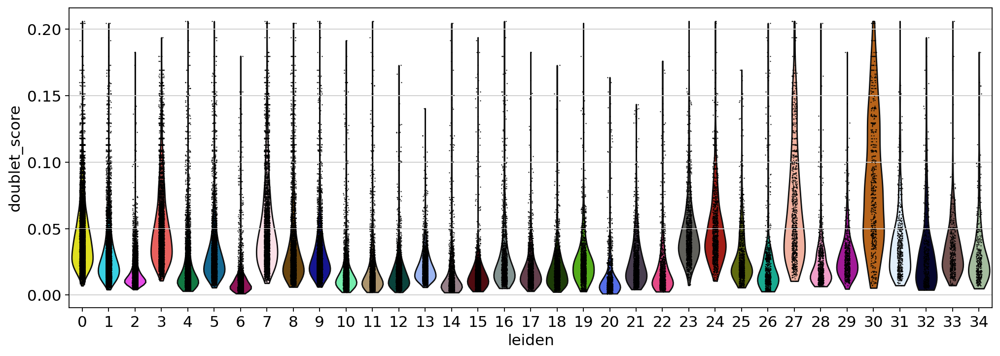

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'doublet_score',groupby="leiden", show=False,ax=axs)

plt.savefig(os.path.join(output_fig_dir,"violin_doublet_score_plot_v3.png"))

In [ ]:
#embedding the graph in two UMAP dimensions
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False,show =False,use_raw=True)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata,init_pos='paga')
sc.pl.umap(adata, color=["sample","leiden"], cmap="tab20",show=False,wspace=0.5)
sc.pl.umap(adata, color=['leiden'], cmap="tab20",show=False,legend_loc = 'on data')

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


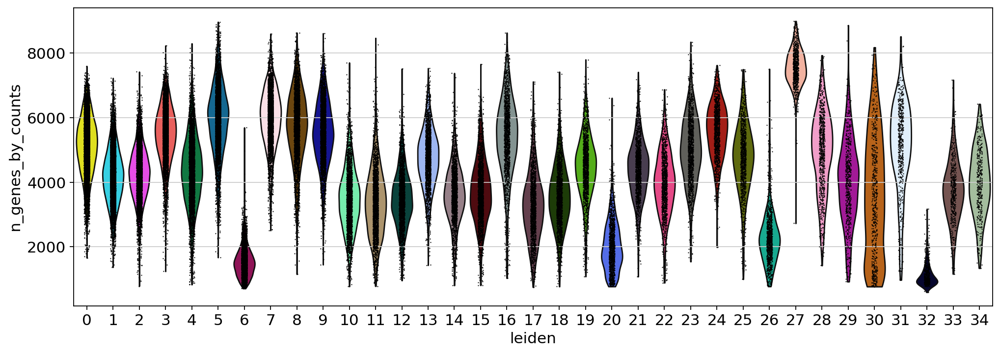

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'n_genes_by_counts',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_n_genes_by_counts_plot_v3.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


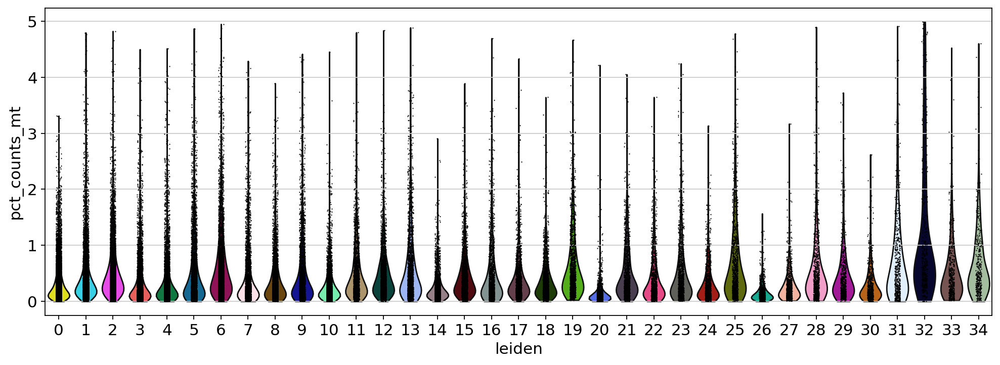

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'pct_counts_mt',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_pct_counts_mt_plot_v3.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


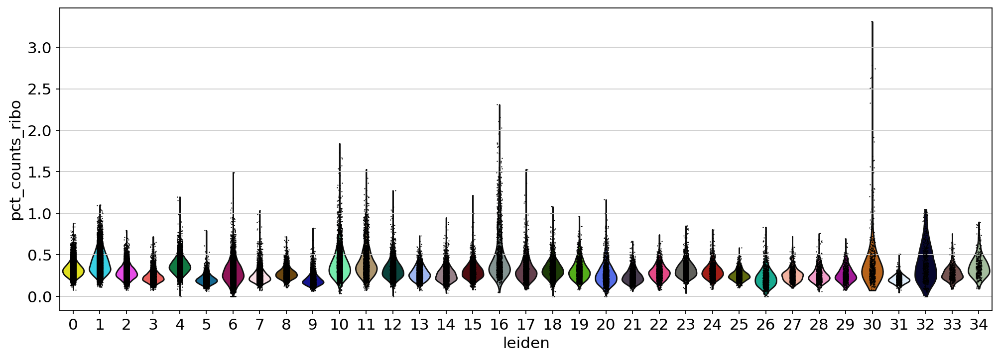

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'pct_counts_ribo',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_pct_counts_ribo_plot_v3.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


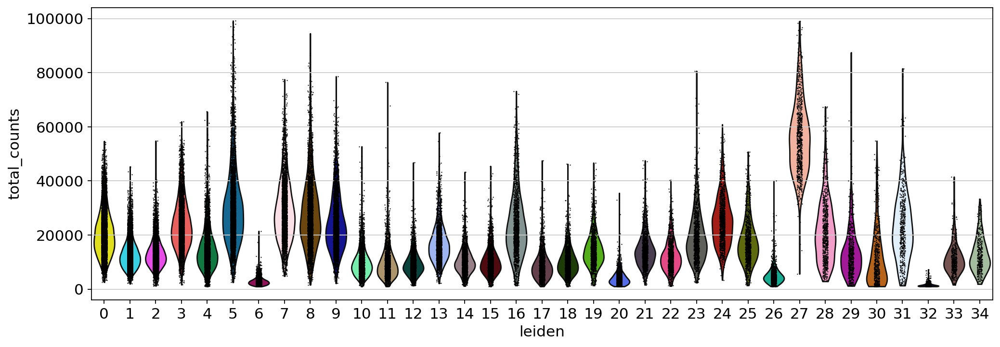

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'total_counts',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_total_counts_plot_v3.png"))

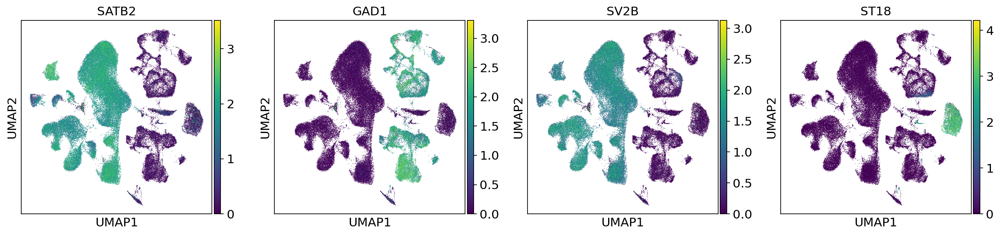

In [ ]:
#show which genes are active in which clusters for the three overall clusters (umap)

sc.pl.umap(adata, color=['SATB2', 'GAD1', 'SV2B','ST18'],show=False)
plt.savefig(os.path.join(output_dir,"chimp_umap_by_cluster_on_marker_genes.png"))

In [ ]:
#re do the clustering with filtered data
sc.tl.leiden(adata, resolution=0.5)
#embedding the graph in two UMAP dimensions
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False,show =False,use_raw=True)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata,init_pos='paga')
sc.pl.umap(adata, color=["sample","leiden"], cmap="tab20",show=False,wspace=0.5)
sc.pl.umap(adata, color=['leiden'], cmap="tab20",show=False,legend_loc = 'on data')

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


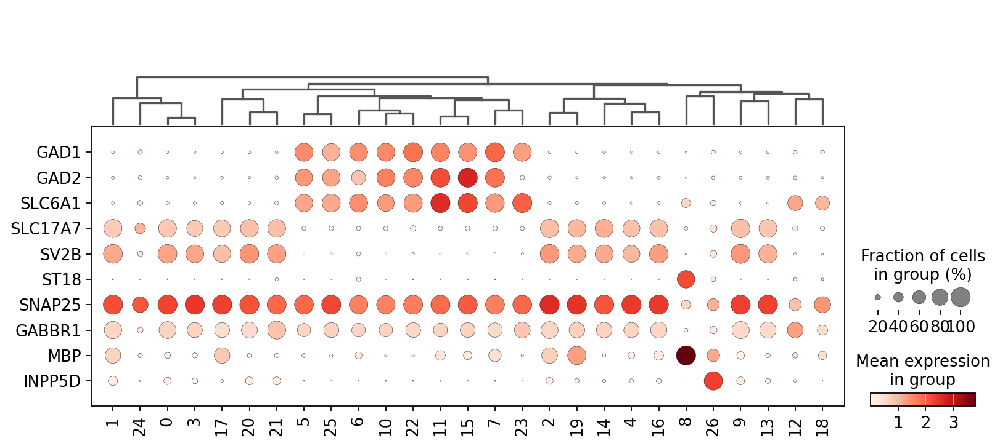

In [ ]:
sc.pl.dotplot(adata, var_names=["GAD1","GAD2","SLC6A1","SLC17A7","SV2B","ST18","SNAP25","GABBR1","MBP","INPP5D"], groupby="leiden", dendrogram=True, swap_axes=True,show=False)
plt.savefig(os.path.join(output_dir,"chimp_dotplot_by_cluster_resol.5.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


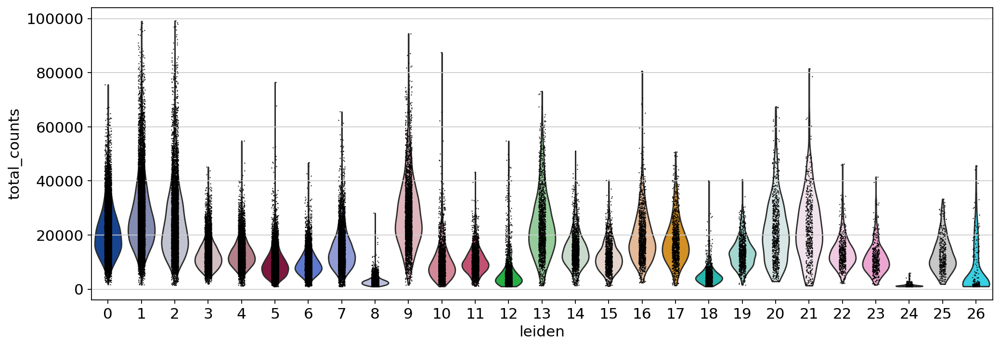

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'total_counts',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_total_counts_plot_v3.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


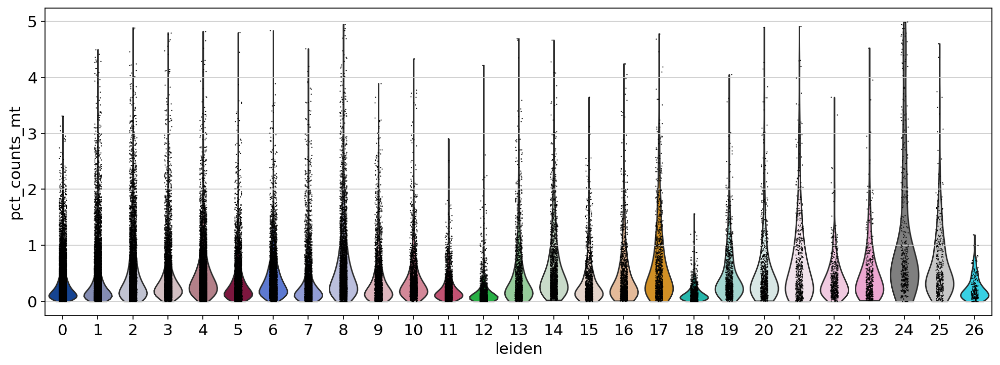

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, 'pct_counts_mt',groupby="leiden", show=False,ax=axs)
plt.savefig(os.path.join(output_fig_dir,"violin_pct_counts_mt_plot_v3.png"))

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:09:31)


/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:401: Perform

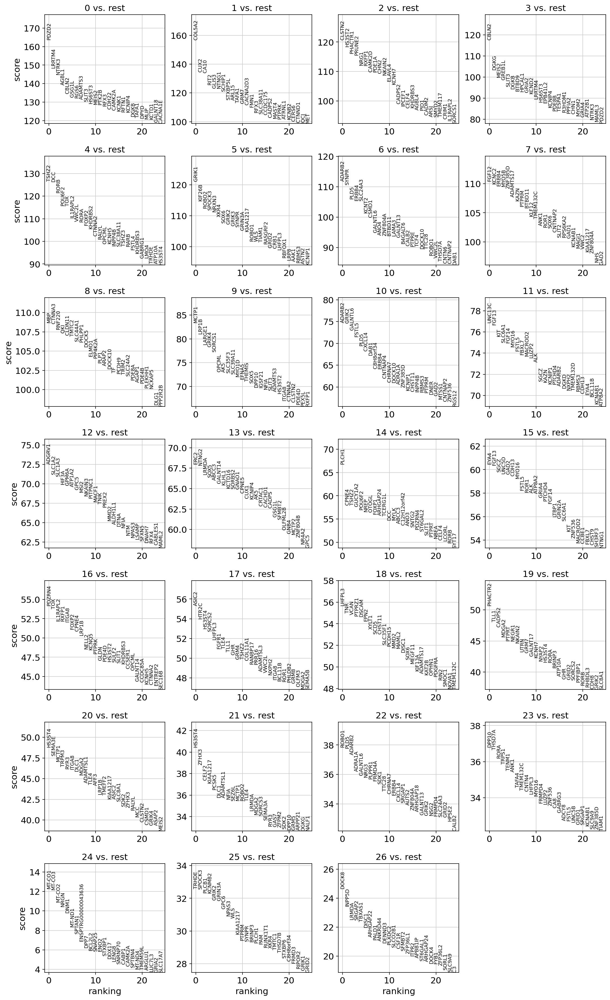

In [ ]:
#Get the most variable genes that define each cluster
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False,show=False)
plt.savefig(os.path.join(output_dir,"rank_genes_groups_v3.png"))

In [ ]:
#Define marker genes into adata
#marker genes GAB: SLC6A1, GAD1. GLUT: SLC17A7. Non Neuronal: CTNNA3
gad1 = adata[:,adata.var_names.str.startswith('GAD1')]
slc6a1 = adata.raw[:,adata.raw.var_names.str.endswith('SLC6A1')]
slc17a7 = adata.raw[:,adata.raw.var_names.str.endswith('SLC17A7')]
#adata[:,adata.var_names.str.startswith('SLC6A1')]
ctnna3 = adata.raw[:,adata.raw.var_names.str.startswith('CTNNA3')]

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, keys="pct_counts_mt", groupby="leiden", ax=axs, show=False)
plt.savefig(os.path.join(output_dir,"violin_pct_counts_mt_plot.png"))

In [ ]:

exc = ["0","1","2","3","4","5","10","12","13","21","22", "24", "25", "26"]
inh = ["6","8","9","11","14","15","16","17","18","20","27","29"]
glial=["7","19","23"]

a1 = ad.AnnData(adata.raw.X,var=adata.raw.var)
a1 = a1[adata.obs.leiden.isin(glial),:]
#a1.raw = adata.raw[adata.obs.leiden.isin(grp1),:]
sc.pl.highest_expr_genes(a1, n_top=20)
a1 = ad.AnnData(adata.raw.X,var=adata.raw.var)
a1 = a1[adata.obs.leiden.isin(exc),:]

sc.pl.highest_expr_genes(a1, n_top=20)
a1 = ad.AnnData(adata.raw.X,var=adata.raw.var)
a1 = a1[adata.obs.leiden.isin(inh),:]

sc.pl.highest_expr_genes(a1, n_top=20)

In [ ]:
adata.obs['dub_pred']=pd.Categorical(adata.obs.predicted_doublet).rename_categories([0,1])
print(adata.obs['dub_pred'].value_counts())

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


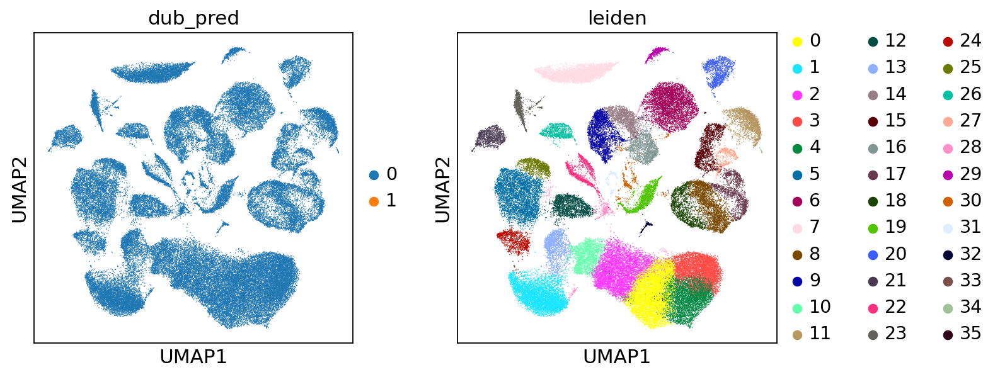

<Figure size 320x320 with 0 Axes>

In [ ]:
sc.pl.umap(adata, color=['dub_pred','leiden'])
plt.savefig(os.path.join(output_dir,"umap_by_cluster_doublet_pred.png"))

/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/content/drive/MyDrive/virtual_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


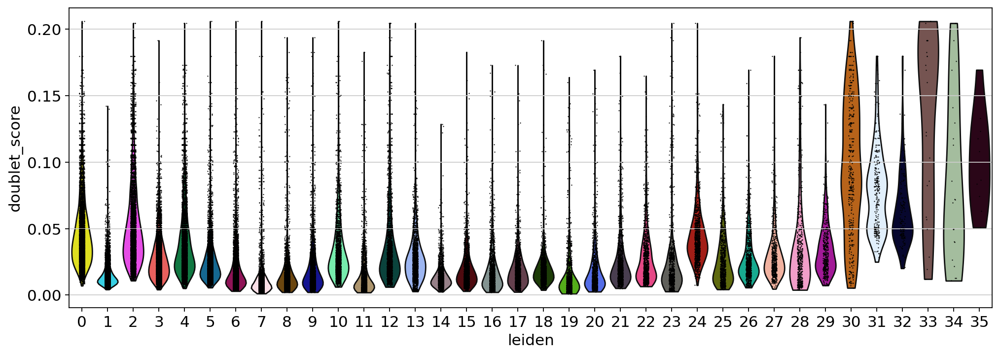

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,5))
sc.pl.violin(adata, keys="doublet_score", groupby="leiden", ax=axs, show=False)
plt.savefig(os.path.join(output_dir,"violin_doublet_score_plot.png"))

In [ ]:
#SNAP25, GRIN2B marker for neuronal cells
#GAB marker gene GAD1, GAD2, SLC6A1, SLC32A1: 6, 8, 9, 11, 14, 15, 16, 17, 18, 20, 27, 29
#GLUT marker gene SLC17A7 : 0, 1, 2, 3, 4, 5, 10, 12, 13, 21, 22, 24, 25, 26
#Non-N: 7, 19, 23
#Exclude: 28,30,31, 32, 33, 34, 35 (high doublet score)
#Divide clusters by their highly expressed genes
#Glutamatergic : exc
#GABAergic : inh
#non_neuron : glial
exc = ["0","1","2","3","4","5","10","12","13","21","22", "24", "25", "26"]
print(adata[adata.obs.leiden.isin(exc),:].shape)
inh = ["6","8","9","11","14","15","16","17","18","20","27","29"]
print(adata[adata.obs.leiden.isin(inh),:].shape)
glial=["7","19","23"]
print(adata[adata.obs.leiden.isin(glial),:].shape)
nonos = ["28","30","31","32","33","34","35"]
print(adata[adata.obs.leiden.isin(nonos),:].shape)

#get sample names for 3 cell classes
exc_smps = adata.obs_names[adata.obs.leiden.isin(exc)]
inh_smps = adata.obs_names[adata.obs.leiden.isin(inh)]
glial_smps = adata.obs_names[adata.obs.leiden.isin(glial)]

exc_adata = adata[adata.obs_names.isin(exc_smps),:]
inh_adata = adata[adata.obs_names.isin(inh_smps),:]
glial_adata = adata[adata.obs_names.isin(glial_smps),:]

#print(exc_adata)
#make a new dataset for each cell type
exc_adata.write_h5ad(os.path.join(output_dir,"exc_filt_norm.h5ad"),compression='gzip')
inh_adata.write_h5ad(os.path.join(output_dir,"inh_filt_norm.h5ad"),compression='gzip')
glial_adata.write_h5ad(os.path.join(output_dir,"glial_filt_norm.h5ad"),compression='gzip')